In [ ]:
#often blurring or smoothing is combined with edge detection

In [ ]:
#method:
    #Gamma Correction: to make image appear brighter or darker depends on gamma value choosen
    #gamma value larger => darker
    #gamma value smaller => brighter

In [ ]:
#method:
    #Kernel Based Filter: 
        #An image kernel is a small matrix used to apply effects like the ones you might find in Photoshop or Gimp, 
        #such as blurring, sharpening, outlining or embossing. They're also used in machine learning for 'feature extraction', a technique for determining the most important portions of an image.

    #for blur:
        # x * 0.0625 + x * 0.125 + x * 0.0625
        # x * 0.125 + M * 0.25 + x * 0.125
        # x * 0.0625 + x * 0.125 + x * 0.0625
        #notice here, x represent a number between 0 - 255, M is the middle block we selected and this will be replaced by the final calculated value

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
def load_img():
    img = cv2.imread("../DATA/bricks.jpg").astype(np.float32) / 255
    '''
        这个 astype(np.float32) / 255 的操作将图像的数据类型从无符号8位整型(uint8)转换为浮点型,并且将所有的像素值归一化到0和1之间。
        这个过程在图像处理和计算机视觉任务中很常见,特别是在使用深度学习模型处理图像时。

        原始图像的像素值通常是0-255的无符号8位整型(uint8),表示RGB颜色的强度。而在计算机视觉和图像处理的许多算法中,我们更希望用浮点数表示像素值,这样可以提供更精确的计算,并允许像素值有小数。

        除此之外,归一化(在这里是除以255)也是一个常见的预处理步骤。这是因为归一化可以使得数据落在一个较小的范围内(在这里是0到1之间),
        这对于许多机器学习和优化算法来说是有益的,因为它可以帮助算法更快地收敛。
    '''
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [7]:
#load_img()
#successfully loaded

In [10]:
#display the img larger
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    #这行代码创建一个新的图形窗口，其大小为 12x10 英寸。
    ax = fig.add_subplot(111)
    #这行代码在 fig 上添加一个新的子图。111 是一个三位整数，其中第一位数字表示子图的行数，第二位数字表示子图的列数，第三位数字表示当前子图的索引，索引从 1 开始。因此，111 表示在一个1x1的子图网格中，当前是第1个子图。
    ax.imshow(img)
    #这行代码在刚刚创建的子图（ax）上显示图像。

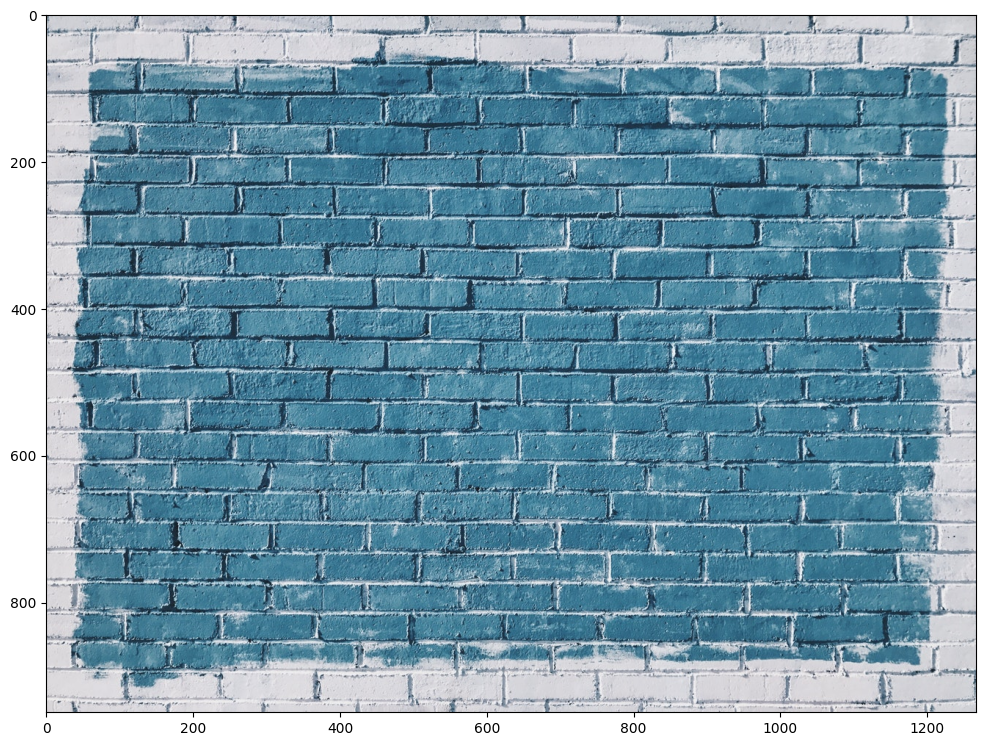

In [11]:
i = load_img()
display_img(i)

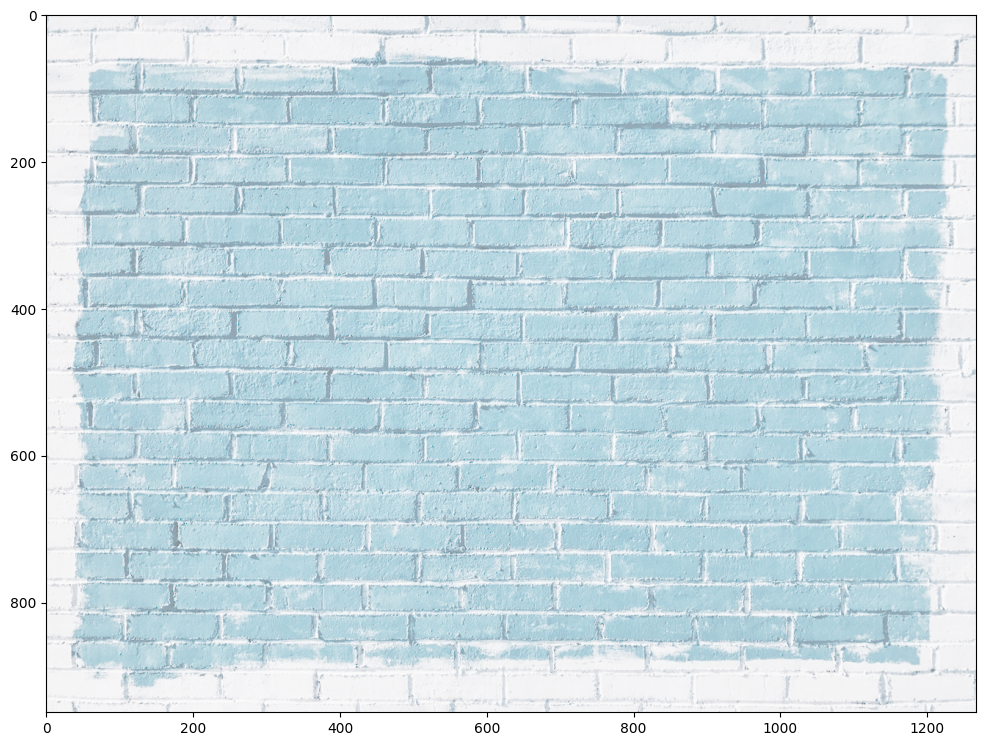

In [13]:
#1. Gamma Correction
gamma = 1 / 4
#gamma < 1 brighter, gamma > 1 darker
result = np.power(i, gamma)
display_img(result)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


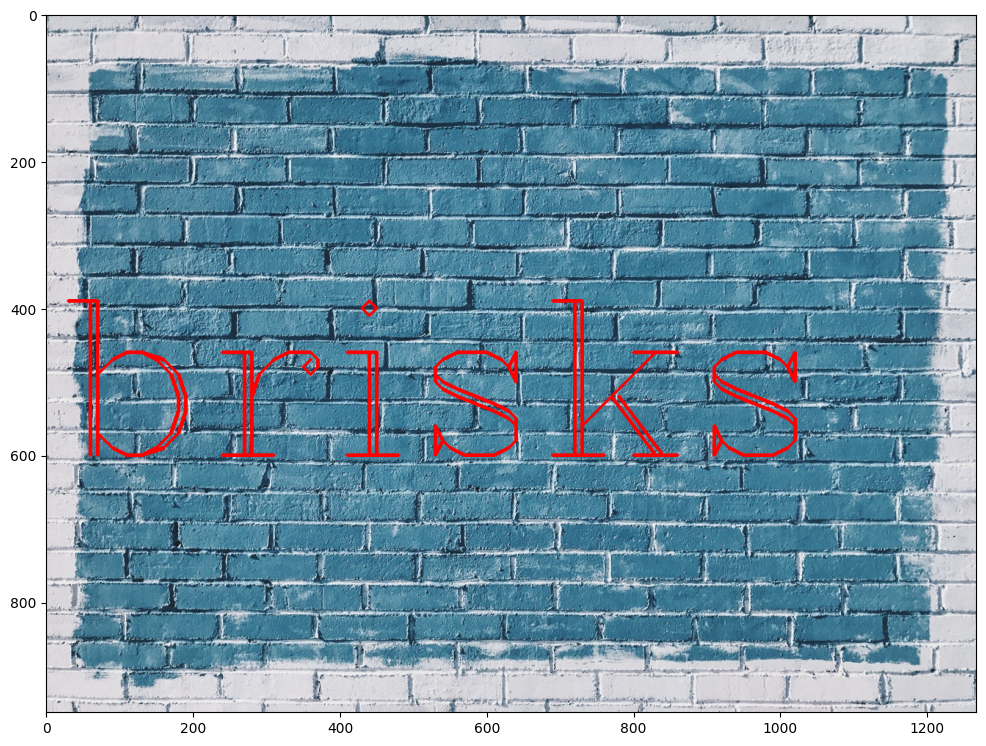

In [20]:
#reload img
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text="brisks",org=(10,600),fontFace=font,fontScale=10,color=(255,0,0),thickness=4) 
#fontFace: 字体， fontScale：字体大小，thickness：线条的粗细
display_img(img)

In [22]:
#create kernels
kernel = np.ones((5,5),dtype=np.float32) / 25  

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


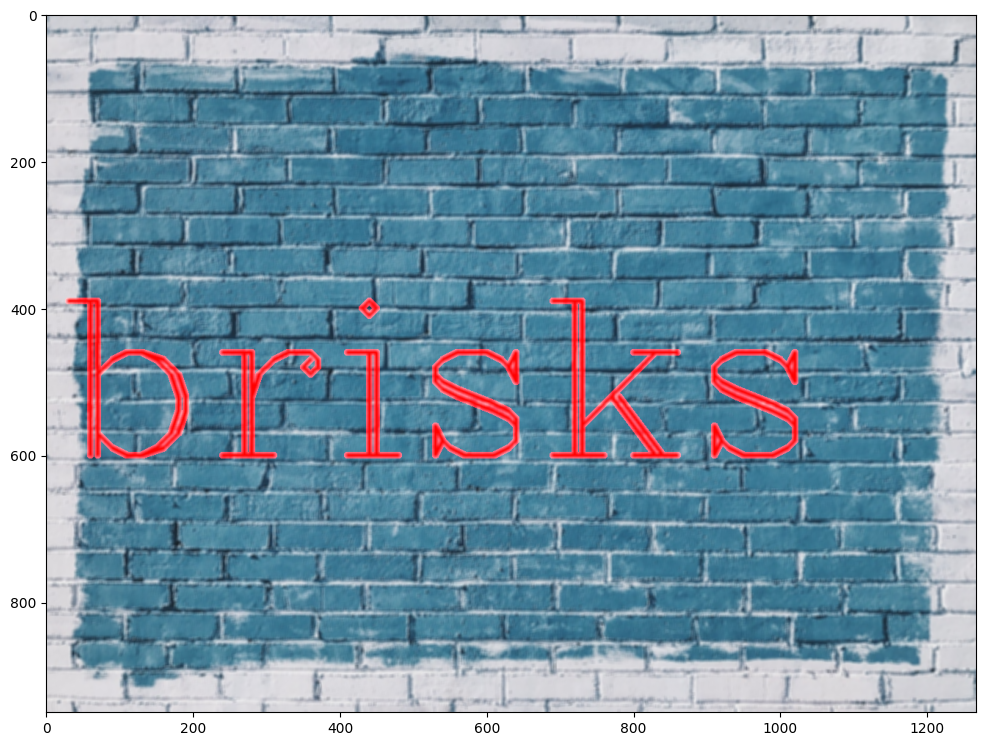

In [29]:
dst = cv2.filter2D(img,-1,kernel)
'''第二个参数是ddepth,它表示目标图像的深度。 -1表示输出图像和输入图像具有相同的深度。'''
display_img(dst)

In [30]:
#reload img
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text="brisks",org=(10,600),fontFace=font,fontScale=10,color=(255,0,0),thickness=4) 
print("reseted")

reseted


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


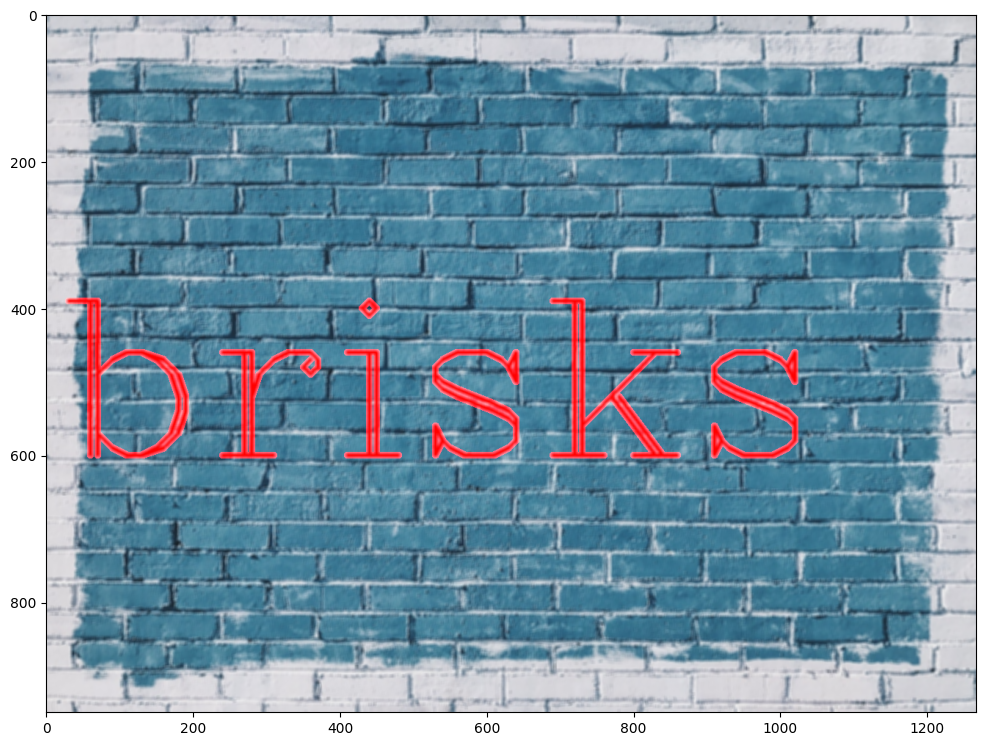

In [35]:
#with build in blur method
blurred = cv2.blur(img,ksize=(5,5)) #ksize: kernel size, 越小越精确，越大越模糊
display_img(blurred)

In [36]:
#reload img
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text="brisks",org=(10,600),fontFace=font,fontScale=10,color=(255,0,0),thickness=4) 
print("reseted")

reseted


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


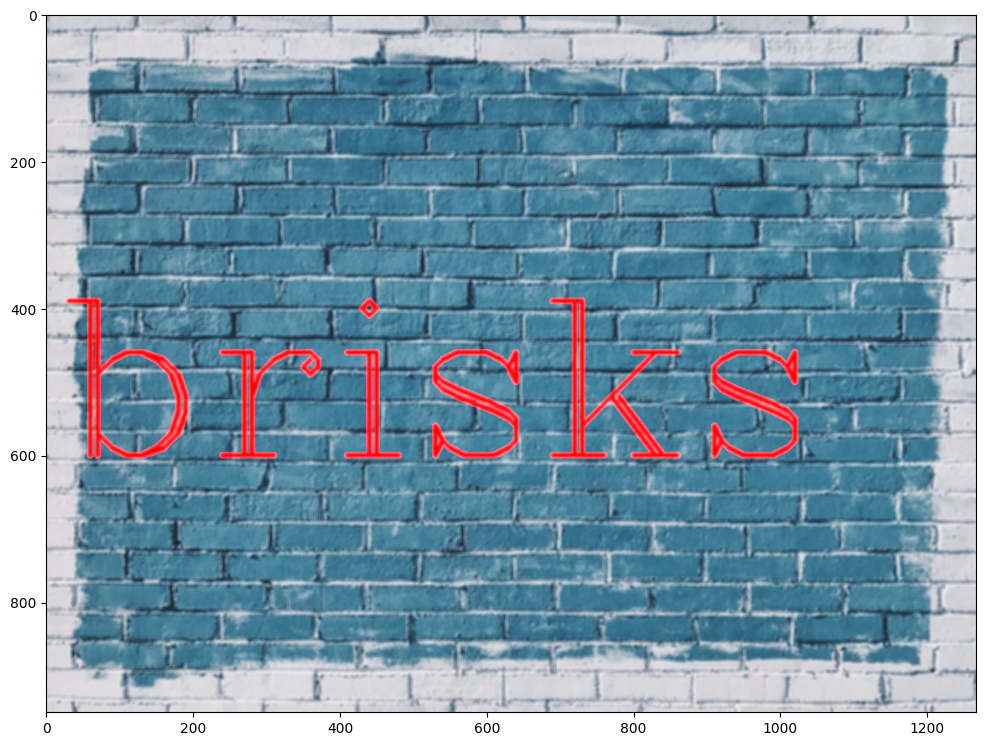

In [40]:
#blur using Gaussian method
blurred_img = cv2.GaussianBlur(img,(5,5),10)
#sigmaX：表示高斯核函数在X方向的的标准偏差。参数 sigmaY 是可选的，并表示高斯核函数在Y方向的标准偏差。如果只指定了 sigmaX ，那么 sigmaY 会与 sigmaX 相同
#标准偏差越大，滤波器的形状越宽，对图像的模糊效果也越强。
display_img(blurred_img)

In [41]:
#reload img
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text="brisks",org=(10,600),fontFace=font,fontScale=10,color=(255,0,0),thickness=4) 
print("reseted")

reseted


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


'注意到同样的ksize下,median blur对于字体中间的噪点处理的更好,能保存更多细节'

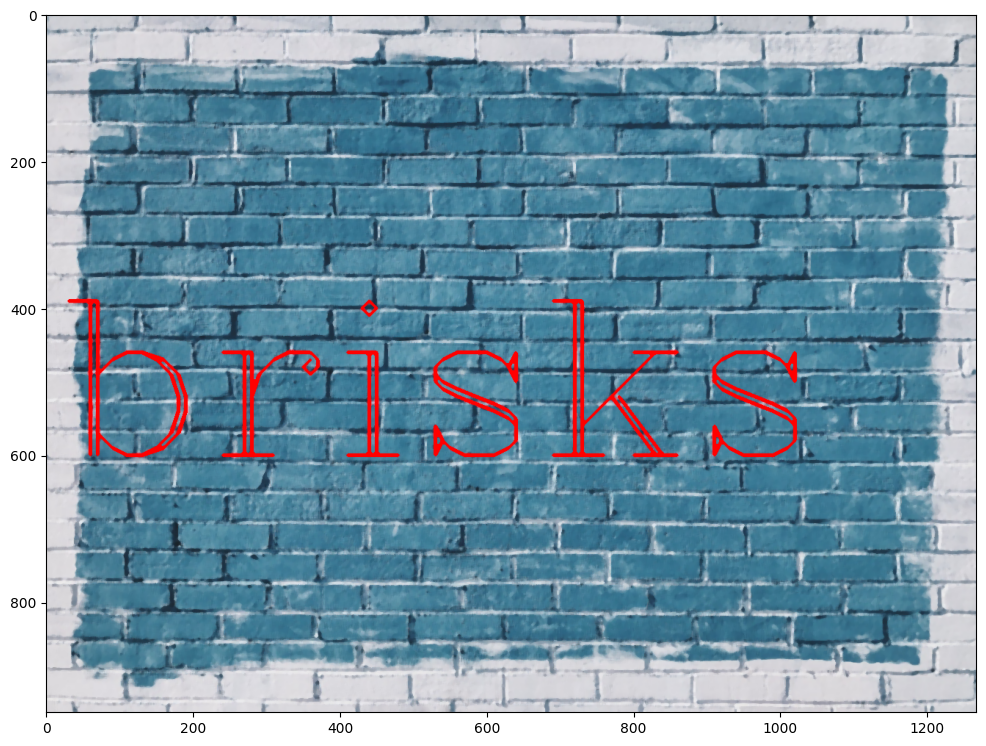

In [43]:
#median blur
median_blur = cv2.medianBlur(img,5) #here ksize is 5, represent (5,5)
display_img(median_blur)
'''注意到同样的ksize下,median blur对于字体中间的噪点处理的更好,能保存更多细节'''

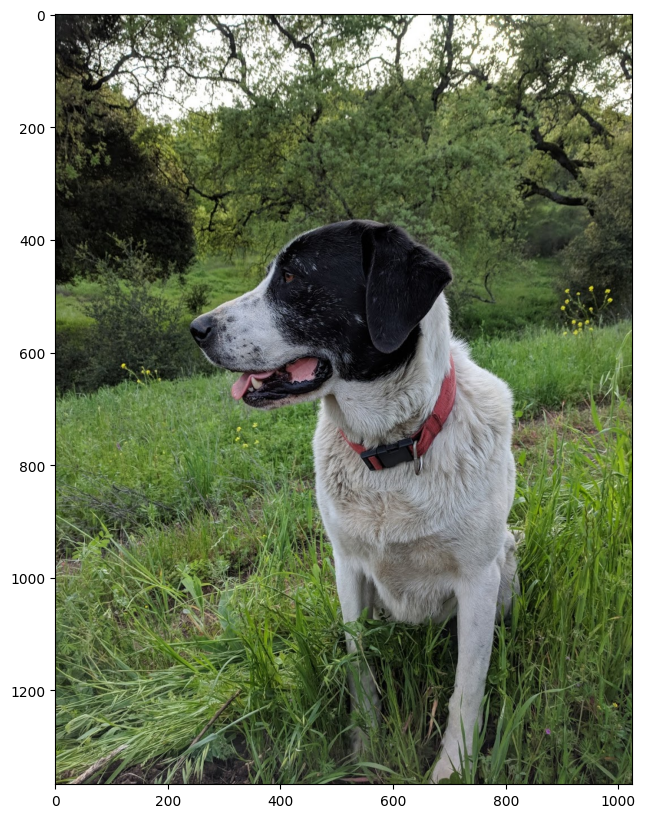

In [44]:
img = cv2.imread("../DATA/sammy.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(img)

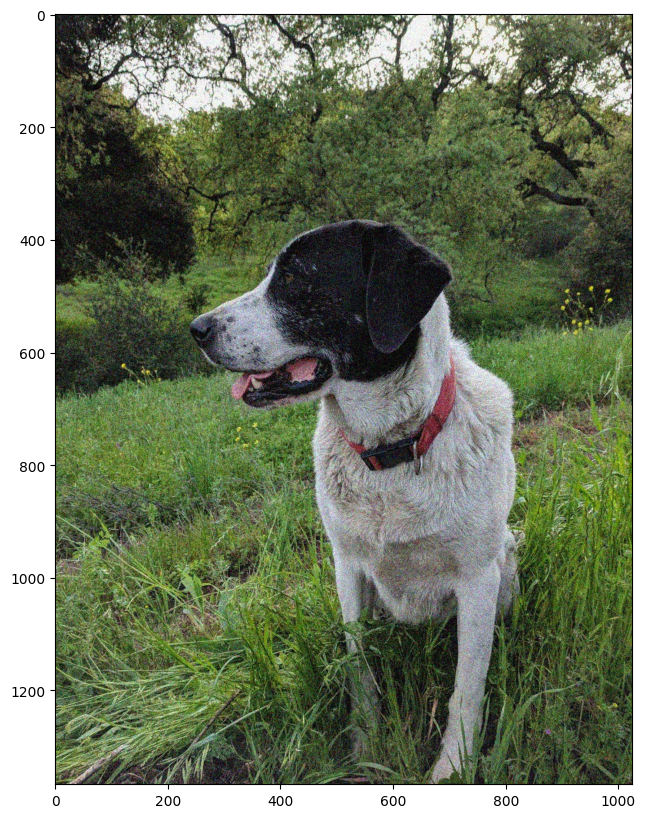

In [45]:
#add noise to this img
noise = cv2.imread("../DATA/sammy_noise.jpg")
display_img(noise)

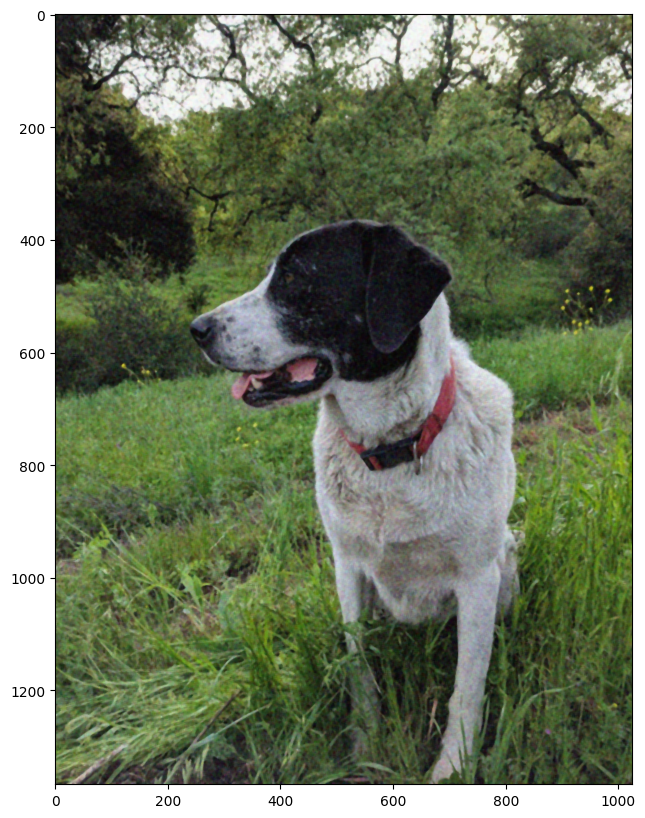

In [50]:
#use median blur to fix the img, remove the noise
median = cv2.medianBlur(noise, 5)
display_img(median)

In [51]:
#reload img
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text="brisks",org=(10,600),fontFace=font,fontScale=10,color=(255,0,0),thickness=4) 
print("reseted")

reseted


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


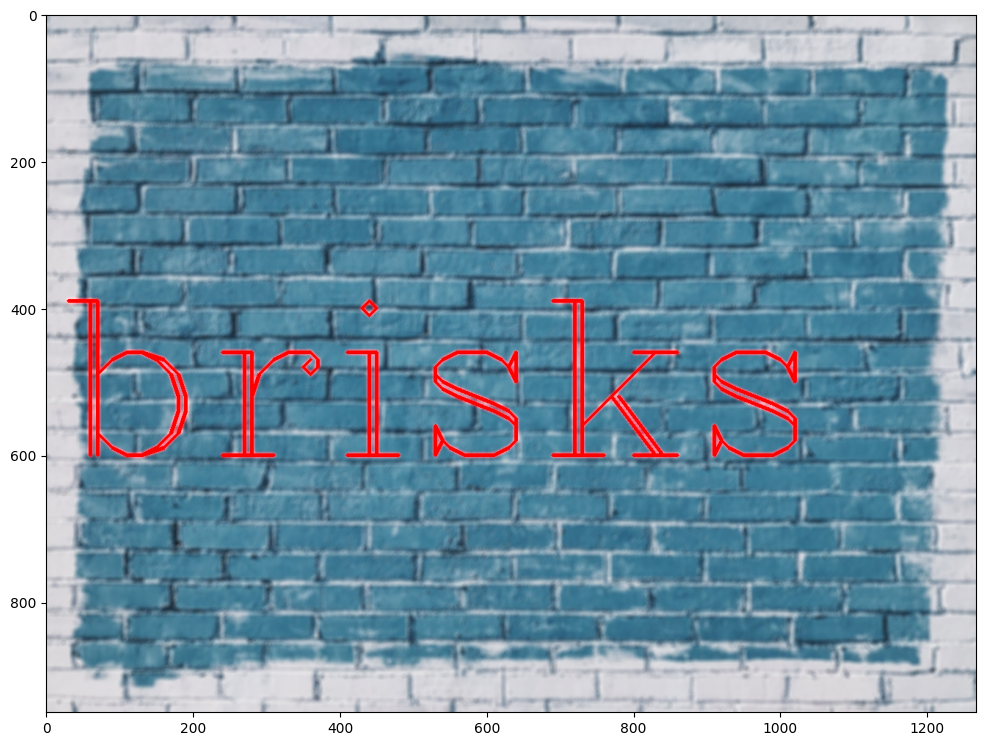

In [52]:
#blur img using bilateralFilter
blur = cv2.bilateralFilter(img,d=9,sigmaColor=75,sigmaSpace=75)
display_img(blur)